# Utilized the scrappy package to scrape reviews of the noise smartwatch and stored them in a file named reviews2.

# Import Libraries

In [1]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt

Load Data sets

In [2]:
data = pd.read_csv("E:\DS Assignments1\\reviews2.csv",encoding='Latin-1')
data

,name,rating,title,review
0,Captain Retail,5,"4.5 â­Awesome design, good specs and features...",The media could not be loaded. Â Most smartwat...
1,Gaurav,1,DO NOT BUY THIS PRODUCT,"Pathetic quality product, not even worth 1000 ..."
2,Ganesh Moily,2,Issue in smartwatch,I am not getting call notification in smart watch
3,Mahir Dalwale,1,Looks doesn't matter.. Completely Worthless!!,Apart from showing accurate time & much health...
4,Saurabh S.,1,worthless product.,this product does not support with one plus ph...
...,...,...,...,...
1343,Arvind S.,5,Top Quality and Great Price.,Bought Colorfit Pro 2 a few weeks back. And I ...
1344,Amazon Customer,4,Decent watch,A decent smart watch . Pretty good features fo...
1345,Suman Kothari,4,Highly recommended â¤ï¸â¤ï¸,The media could not be loaded. Â The watch giv...
1346,Debdatta Dey,4,All over good watch..except two problems,The product is really good..but one drawback f...


Our attention will be focused on the "rating", "title", and "review" columns, since they contain the most qualitative information. The "rating" column would not be subjected to any pre-processing. Let's start by dropping the "name" column

In [3]:
data.drop(['name'],inplace=True,axis=1)
data.head()

,rating,title,review
0,5,"4.5 â­Awesome design, good specs and features...",The media could not be loaded. Â Most smartwat...
1,1,DO NOT BUY THIS PRODUCT,"Pathetic quality product, not even worth 1000 ..."
2,2,Issue in smartwatch,I am not getting call notification in smart watch
3,1,Looks doesn't matter.. Completely Worthless!!,Apart from showing accurate time & much health...
4,1,worthless product.,this product does not support with one plus ph...


In [4]:
data["reviews"] = data["title"]+data["review"]
data.head()

,rating,title,review,reviews
0,5,"4.5 â­Awesome design, good specs and features...",The media could not be loaded. Â Most smartwat...,"4.5 â­Awesome design, good specs and features..."
1,1,DO NOT BUY THIS PRODUCT,"Pathetic quality product, not even worth 1000 ...",DO NOT BUY THIS PRODUCTPathetic quality produc...
2,2,Issue in smartwatch,I am not getting call notification in smart watch,Issue in smartwatchI am not getting call notif...
3,1,Looks doesn't matter.. Completely Worthless!!,Apart from showing accurate time & much health...,Looks doesn't matter.. Completely Worthless!!A...
4,1,worthless product.,this product does not support with one plus ph...,worthless product.this product does not suppor...


Merging review and title column & create reviews column

In [5]:
data.drop(['title'],inplace=True,axis=1)
data.drop(['review'],inplace=True,axis=1)
data.head()

,rating,reviews
0,5,"4.5 â­Awesome design, good specs and features..."
1,1,DO NOT BUY THIS PRODUCTPathetic quality produc...
2,2,Issue in smartwatchI am not getting call notif...
3,1,Looks doesn't matter.. Completely Worthless!!A...
4,1,worthless product.this product does not suppor...


In [6]:
sample_data = data.copy()

# Data Preprocessing

Looking for NA values

In [7]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1348 entries, 0 to 1347
Data columns (total 2 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   rating   1348 non-null   int64 
 1   reviews  1347 non-null   object
dtypes: int64(1), object(1)
memory usage: 21.2+ KB


In [8]:
data.isnull().sum()

rating     0
reviews    1
dtype: int64

In [9]:
data[data.isnull().any(axis=1)].head()

,rating,reviews
16,5,NaN


In [10]:
data = data.dropna(axis=0)

In [11]:
data.isnull().sum()

rating     0
reviews    0
dtype: int64

In [12]:
data.head()

,rating,reviews
0,5,"4.5 â­Awesome design, good specs and features..."
1,1,DO NOT BUY THIS PRODUCTPathetic quality produc...
2,2,Issue in smartwatchI am not getting call notif...
3,1,Looks doesn't matter.. Completely Worthless!!A...
4,1,worthless product.this product does not suppor...


Descriptive Statistics

In [13]:
data.describe()

,rating
count,1347.000000
mean,2.600594
std,1.603099
min,1.000000
25%,1.000000
50%,2.000000
75%,4.000000
max,5.000000


In [14]:
data['rating'].value_counts()

1    572
5    257
4    225
3    160
2    133
Name: rating, dtype: int64

# Visualization

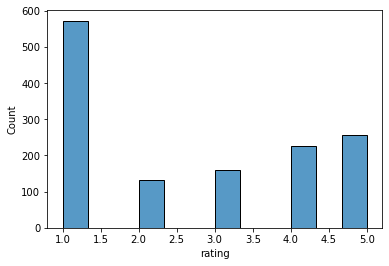

In [15]:
sns.histplot(data.rating)
plt.show()

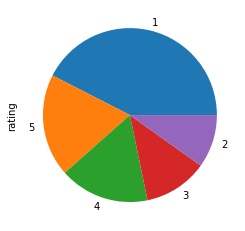

In [16]:
data.rating.value_counts().plot(kind='pie')
plt.show()

check duplicate

In [17]:
data.duplicated().sum()

0

# Text Preprocessing

In [18]:
import nltk
nltk.download('punkt')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\lenovo\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [19]:
from nltk.corpus import stopwords
import string
string.punctuation
from nltk.stem.porter import PorterStemmer
ps=PorterStemmer()


def clean_review(text):
    text=text.lower()   #lower
    text=nltk.word_tokenize(text) #tokenize 
    
    y=[]
    for i in text:
        if i.isalnum():
            y.append(i)
           
    text=y[:]  
    y.clear()
    
    for i in text:
        if i not in stopwords.words('english')and i not in string.punctuation:   #Removing StopWords
            y.append(i)
         
    text=y[:]
    y.clear()
    
    for i in text:
        y.append(ps.stem(i))   #Stemming
    
    return " ".join(y)

In [20]:
data['clean_review']=data['reviews'].apply(clean_review)

<ipython-input-20-6e7a8ed76cbc>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['clean_review']=data['reviews'].apply(clean_review)


In [21]:
pd.options.display.max_rows=None
data

,rating,reviews,clean_review
0,5,"4.5 â­Awesome design, good specs and features...",design good spec featur miband media could loa...
1,1,DO NOT BUY THIS PRODUCTPathetic quality produc...,buy productpathet qualiti product even worth 1...
2,2,Issue in smartwatchI am not getting call notif...,issu smartwatchi get call notif smart watch
3,1,Looks doesn't matter.. Completely Worthless!!A...,look matter complet worthless apart show accur...
4,1,worthless product.this product does not suppor...,worthless product support one plu phone worthl...
5,4,"Oh yes,love itðThe media could not be loade...",oh ye love media could load â receiv watch pre...
6,1,Don't buy this product!!Don't buy this product...,buy product buy product receiv product 23rd de...
7,1,Bluetooth coverage is low..max 1 to 2 mtrsBlue...,bluetooth coverag low max 1 2 mtrsbluetooth co...
8,4,Read it! before buyingThe product is good for ...,read buyingth product good price sold accuraci...
9,4,"Value for moneyAfter using for 20 days, i am h...",valu moneyaft use 20 day write review product ...


# Generate Word Cloud

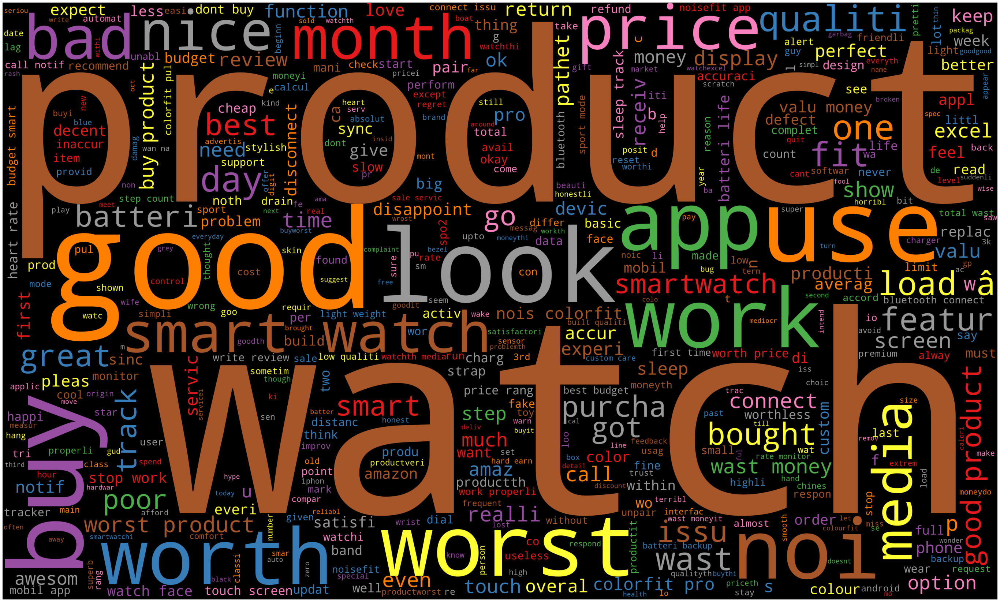

In [22]:
# Define a function to plot word cloud
def plot_cloud(wordcloud):
    plt.figure(figsize=(50,30))
    plt.imshow(wordcloud)
    plt.axis('off')
    
# Generate Word Cloud

from wordcloud import WordCloud, STOPWORDS

STOPWORDS.add('pron')
STOPWORDS.add('rt')
STOPWORDS.add('yeah')
wordcloud=WordCloud(width=5000,height=3000,background_color='black',max_words=500,
                   colormap='Set1',stopwords=STOPWORDS).generate(str(data['clean_review']))
plot_cloud(wordcloud)
plt.show()

# Feature Extaction

# 1. Using CountVectorizer

Import Libraries

In [23]:
from sklearn.feature_extraction.text import CountVectorizer

In [24]:
cv=CountVectorizer()
reviewcv=cv.fit_transform(data['clean_review'])
print(cv.get_feature_names())

['0i', '0mi', '10', '100', '1000', '10000r', '1000have', '1000r', '10am', '10day', '10k', '10km', '10th', '11', '110', '1100', '110017mobil', '110680', '1195', '11th', '12', '120', '1200', '125', '12k', '12th', '13', '136', '1400', '144', '14th', '15', '15000', '1520', '15500', '1599', '15day', '15step', '15th', '1600', '1600one', '1699', '1699r', '16th', '17', '17th', '18', '180', '1800', '1899', '18th', '1900', '1999', '1999r', '1day', '1km', '1m', '1month', '1or', '1st', '20', '200', '2000', '2020', '2021', '20day', '20th', '21', '210', '210mah', '21st', '2250r', '22mm', '23rd', '24', '240x240', '2499', '24hour', '24hr', '25', '2500', '2599', '26th', '2799', '2799touch', '27dec20', '27th', '28th', '2999', '2999r', '2a', '2after', '2day', '2great', '2hr', '2i', '2k', '2kgot', '2km', '2look', '2m', '2nd', '2nois', '2pro', '2smart', '2veri', '2week', '2xl', '30', '3000', '30day', '30th', '3100', '3199', '3199bought', '31st', '3499', '35', '3500', '35g', '35gm', '35k', '36', '39', '3999

In [25]:
cv = CountVectorizer()

reviewcv = cv.fit_transform(data['clean_review'])
sum_words = reviewcv.sum(axis=0)
words_freq = [(word, sum_words[0, idx]) for word, idx in cv.vocabulary_.items()]
words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
wf_df = pd.DataFrame(words_freq)
wf_df.columns = ['word', 'count']


pd.options.display.max_rows=None
wf_df

,word,count
0,watch,1707
1,product,1010
2,good,847
3,app,663
4,work,528
5,buy,494
6,use,475
7,time,410
8,day,407
9,look,390


# 2. CountVectorizer with N-grams (Bigrams & Trigrams)

Bi-gram

In [26]:
#Bi-gram
def get_top_n2_words(corpus, n=None):
    vec1 = CountVectorizer(ngram_range=(2,2), 
            max_features=2000).fit(corpus)
    bag_of_words = vec1.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in     
                  vec1.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], 
                reverse=True)
    return words_freq[:n]

In [27]:
top2_words = get_top_n2_words(data['clean_review'], n=5000) 
top2_df = pd.DataFrame(top2_words)
top2_df.columns=["Bi-gram", "Freq"]
top2_df

,Bi-gram,Freq
0,smart watch,187
1,watch face,159
2,heart rate,129
3,wast money,105
4,batteri life,101
5,buy product,78
6,sleep track,75
7,media could,69
8,could load,69
9,touch screen,65


Bi-gram plot

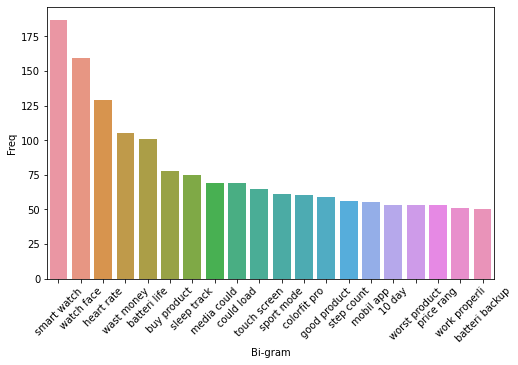

In [28]:
import matplotlib.pyplot as plt
import seaborn as sns
top20_bigram = top2_df.iloc[0:20,:]
fig = plt.figure(figsize = (8, 5))
plot=sns.barplot(x=top20_bigram["Bi-gram"],y=top20_bigram["Freq"])
plot.set_xticklabels(rotation=45,labels = top20_bigram["Bi-gram"])
plt.show()

Tri-gram

In [29]:
def get_top_n3_words(corpus, n=None):
    vec1 = CountVectorizer(ngram_range=(3,3), 
            max_features=2000).fit(corpus)
    bag_of_words = vec1.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in     
                  vec1.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], 
                reverse=True)
    return words_freq[:n]

In [30]:
top3_words = get_top_n3_words(data['clean_review'], n=5000)
top3_df = pd.DataFrame(top3_words)
top3_df.columns=["Tri-gram", "Freq"]

top3_df

,Tri-gram,Freq
0,media could load,69
1,nois colorfit pro,32
2,heart rate monitor,24
3,batteri life good,18
4,nois fit app,17
5,like appl watch,13
6,heart rate sensor,13
7,buy dont buy,13
8,smart watch price,13
9,good look good,12


Tri-gram plot

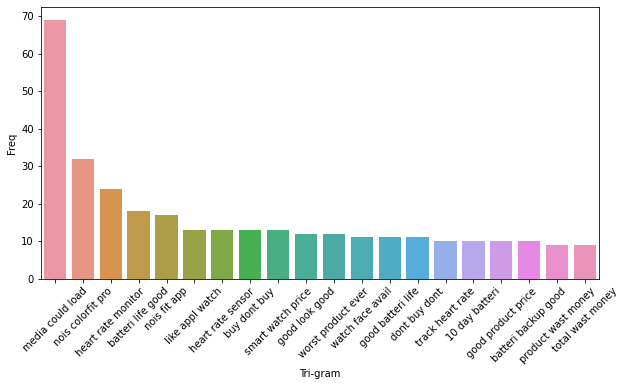

In [31]:
import seaborn as sns
top20_trigram = top3_df.iloc[0:20,:]
fig = plt.figure(figsize = (10, 5))
plot=sns.barplot(x=top20_trigram["Tri-gram"],y=top20_trigram["Freq"])
plot.set_xticklabels(rotation=45,labels = top20_trigram["Tri-gram"])
plt.show()

# Named Entity Recognition (NER)

Part Of Speech Tagging

In [32]:
import string 
import re #regular expression
import spacy

In [33]:
nlp = spacy.load("en_core_web_sm")

one_block = str(data['clean_review'])
doc_block = nlp(one_block)
spacy.displacy.render(doc_block, style='ent', jupyter=True)

In [34]:
nouns_verbs=[token.text for token in doc_block if token.pos_ in ('NOUN','VERB')]
print(nouns_verbs)

['design', 'media', 'loa', 'productpathet', 'product', 'issu', 'smartwatchi', 'get', 'call', 'matter', 'complet', 'product', 'support', 'plu', 'phone', 'worthl', 'ye', 'love', 'media', 'load', 'â', 'watch', 'pre', 'buy', 'product', 'buy', 'product', 'receiv', 'product', '23rd', 'max', 'mtrsbluetooth', 'co', 'read', 'buyingth', 'product', 'price', 'sold', 'accuraci', 'valu', 'moneyaft', 'use', 'day', 'write', 'review', 'product', 'rupe', 'beg', 'buythi', 'product', 'e', 'disconnect', 'everytimei', 'price', 'buy', 'product', 'recommend', 'buy', 'l', 'watchbackground', 'buy', 'watch', 'made', 'watch', 'read', 'product', 'get', 'rest', 'lovabl', 'product', 'companythank', 'color', 'display', 'size', 'p', 'recommend', 'deceit', 'request', 'custom', 'servicehad', 'made', 'product', 'thought', 'warn', 'stay', 'product', 'product', 'watch', 'use', 'watch', 'month', 'am', 'amaz', 'productjust', 'love', 'product', 'buy', 'display', 'price', 'point', 'look', 'pie', 'frustrat', 'issu', 'watch', 'q

In [35]:
len(nouns_verbs)

5687

Counting the noun & verb tokens

In [36]:

from sklearn.feature_extraction.text import CountVectorizer
cv=CountVectorizer()

X=cv.fit_transform(nouns_verbs)
sum_words=X.sum(axis=0)

words_freq=[(word,sum_words[0,idx]) for word,idx in cv.vocabulary_.items()]
words_freq=sorted(words_freq, key=lambda x: x[1], reverse=True)

wd_df=pd.DataFrame(words_freq)
wd_df.columns=['word','count']
wd_df

,word,count
0,product,391
1,watch,383
2,buy,165
3,use,121
4,look,114
5,work,94
6,price,84
7,wast,74
8,money,69
9,media,64


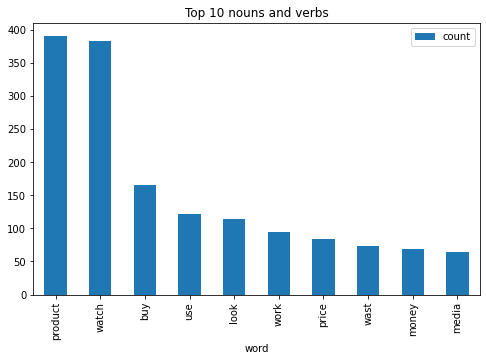

In [37]:
# Visualizing results (Barchart for top 10 nouns + verbs)
wd_df[0:10].plot.bar(x='word',figsize=(8,5),title='Top 10 nouns and verbs');
plt.show()

# Generate Word Cloud

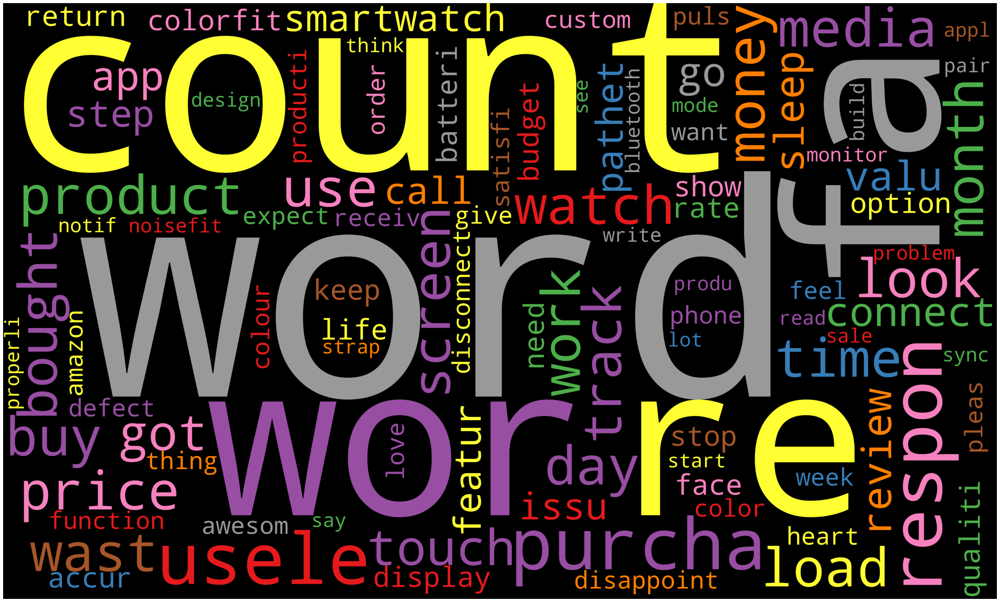

In [38]:
# Define a function to plot word cloud
def plot_cloud(wordcloud):
    plt.figure(figsize=(40,30))
    plt.imshow(wordcloud)
    plt.axis('off')
    
# Generate Word Cloud

from wordcloud import WordCloud, STOPWORDS

STOPWORDS.add('pron')
STOPWORDS.add('rt')
STOPWORDS.add('yeah')
wordcloud=WordCloud(width=5000,height=3000,background_color='black',max_words=100,
                   colormap='Set1',stopwords=STOPWORDS).generate(str(wd_df))
plot_cloud(wordcloud)
plt.show()

In [39]:
data

,rating,reviews,clean_review
0,5,"4.5 â­Awesome design, good specs and features...",design good spec featur miband media could loa...
1,1,DO NOT BUY THIS PRODUCTPathetic quality produc...,buy productpathet qualiti product even worth 1...
2,2,Issue in smartwatchI am not getting call notif...,issu smartwatchi get call notif smart watch
3,1,Looks doesn't matter.. Completely Worthless!!A...,look matter complet worthless apart show accur...
4,1,worthless product.this product does not suppor...,worthless product support one plu phone worthl...
5,4,"Oh yes,love itðThe media could not be loade...",oh ye love media could load â receiv watch pre...
6,1,Don't buy this product!!Don't buy this product...,buy product buy product receiv product 23rd de...
7,1,Bluetooth coverage is low..max 1 to 2 mtrsBlue...,bluetooth coverag low max 1 2 mtrsbluetooth co...
8,4,Read it! before buyingThe product is good for ...,read buyingth product good price sold accuraci...
9,4,"Value for moneyAfter using for 20 days, i am h...",valu moneyaft use 20 day write review product ...


In [40]:
data['num_words']=data['clean_review'].apply(lambda x:len(nltk.word_tokenize(x)))

<ipython-input-40-2b9c8a6ffeb0>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['num_words']=data['clean_review'].apply(lambda x:len(nltk.word_tokenize(x)))


count the no of word in reviews

In [41]:
data

,rating,reviews,clean_review,num_words
0,5,"4.5 â­Awesome design, good specs and features...",design good spec featur miband media could loa...,379
1,1,DO NOT BUY THIS PRODUCTPathetic quality produc...,buy productpathet qualiti product even worth 1...,22
2,2,Issue in smartwatchI am not getting call notif...,issu smartwatchi get call notif smart watch,7
3,1,Looks doesn't matter.. Completely Worthless!!A...,look matter complet worthless apart show accur...,57
4,1,worthless product.this product does not suppor...,worthless product support one plu phone worthl...,11
5,4,"Oh yes,love itðThe media could not be loade...",oh ye love media could load â receiv watch pre...,22
6,1,Don't buy this product!!Don't buy this product...,buy product buy product receiv product 23rd de...,37
7,1,Bluetooth coverage is low..max 1 to 2 mtrsBlue...,bluetooth coverag low max 1 2 mtrsbluetooth co...,58
8,4,Read it! before buyingThe product is good for ...,read buyingth product good price sold accuraci...,53
9,4,"Value for moneyAfter using for 20 days, i am h...",valu moneyaft use 20 day write review product ...,106


# Sentiment Analysis

# Define Subjectivity & Polarity

In [42]:
from textblob import TextBlob
def getSubjectivity(clean_review):
    return TextBlob(clean_review).sentiment.subjectivity

def getPolarity(clean_review):
    return TextBlob(clean_review).sentiment.polarity

data['Subjectivity'] = data['clean_review'].apply(getSubjectivity)
data['Polarity'] = data['clean_review'].apply(getPolarity)

<ipython-input-42-582c059d1443>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['Subjectivity'] = data['clean_review'].apply(getSubjectivity)
<ipython-input-42-582c059d1443>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['Polarity'] = data['clean_review'].apply(getPolarity)


In [43]:
data

,rating,reviews,clean_review,num_words,Subjectivity,Polarity
0,5,"4.5 â­Awesome design, good specs and features...",design good spec featur miband media could loa...,379,0.460618,2.613863e-01
1,1,DO NOT BUY THIS PRODUCTPathetic quality produc...,buy productpathet qualiti product even worth 1...,22,0.250000,-2.775558e-17
2,2,Issue in smartwatchI am not getting call notif...,issu smartwatchi get call notif smart watch,7,0.642857,2.142857e-01
3,1,Looks doesn't matter.. Completely Worthless!!A...,look matter complet worthless apart show accur...,57,0.425108,1.194805e-01
4,1,worthless product.this product does not suppor...,worthless product support one plu phone worthl...,11,0.900000,-8.000000e-01
5,4,"Oh yes,love itðThe media could not be loade...",oh ye love media could load â receiv watch pre...,22,0.600000,6.000000e-01
6,1,Don't buy this product!!Don't buy this product...,buy product buy product receiv product 23rd de...,37,0.642857,2.142857e-01
7,1,Bluetooth coverage is low..max 1 to 2 mtrsBlue...,bluetooth coverag low max 1 2 mtrsbluetooth co...,58,0.472738,6.702381e-02
8,4,Read it! before buyingThe product is good for ...,read buyingth product good price sold accuraci...,53,0.458333,3.916667e-01
9,4,"Value for moneyAfter using for 20 days, i am h...",valu moneyaft use 20 day write review product ...,106,0.424872,4.315385e-01


# Create Positive, Negative & Neutral Reviews

In [44]:
# function to analyze the reviews
def getAnalysis(score):
    if score < 0:
        return 'Negative'
    elif score == 0:
        return 'Neutral'
    else:
        return 'Positive'

    
data['Analysis'] = data['Polarity'].apply(getAnalysis)

<ipython-input-44-8aee8304b809>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['Analysis'] = data['Polarity'].apply(getAnalysis)


In [45]:
data

,rating,reviews,clean_review,num_words,Subjectivity,Polarity,Analysis
0,5,"4.5 â­Awesome design, good specs and features...",design good spec featur miband media could loa...,379,0.460618,2.613863e-01,Positive
1,1,DO NOT BUY THIS PRODUCTPathetic quality produc...,buy productpathet qualiti product even worth 1...,22,0.250000,-2.775558e-17,Negative
2,2,Issue in smartwatchI am not getting call notif...,issu smartwatchi get call notif smart watch,7,0.642857,2.142857e-01,Positive
3,1,Looks doesn't matter.. Completely Worthless!!A...,look matter complet worthless apart show accur...,57,0.425108,1.194805e-01,Positive
4,1,worthless product.this product does not suppor...,worthless product support one plu phone worthl...,11,0.900000,-8.000000e-01,Negative
5,4,"Oh yes,love itðThe media could not be loade...",oh ye love media could load â receiv watch pre...,22,0.600000,6.000000e-01,Positive
6,1,Don't buy this product!!Don't buy this product...,buy product buy product receiv product 23rd de...,37,0.642857,2.142857e-01,Positive
7,1,Bluetooth coverage is low..max 1 to 2 mtrsBlue...,bluetooth coverag low max 1 2 mtrsbluetooth co...,58,0.472738,6.702381e-02,Positive
8,4,Read it! before buyingThe product is good for ...,read buyingth product good price sold accuraci...,53,0.458333,3.916667e-01,Positive
9,4,"Value for moneyAfter using for 20 days, i am h...",valu moneyaft use 20 day write review product ...,106,0.424872,4.315385e-01,Positive


In [46]:
data.reset_index(inplace=True)
data

,index,rating,reviews,clean_review,num_words,Subjectivity,Polarity,Analysis
0,0,5,"4.5 â­Awesome design, good specs and features...",design good spec featur miband media could loa...,379,0.460618,2.613863e-01,Positive
1,1,1,DO NOT BUY THIS PRODUCTPathetic quality produc...,buy productpathet qualiti product even worth 1...,22,0.250000,-2.775558e-17,Negative
2,2,2,Issue in smartwatchI am not getting call notif...,issu smartwatchi get call notif smart watch,7,0.642857,2.142857e-01,Positive
3,3,1,Looks doesn't matter.. Completely Worthless!!A...,look matter complet worthless apart show accur...,57,0.425108,1.194805e-01,Positive
4,4,1,worthless product.this product does not suppor...,worthless product support one plu phone worthl...,11,0.900000,-8.000000e-01,Negative
5,5,4,"Oh yes,love itðThe media could not be loade...",oh ye love media could load â receiv watch pre...,22,0.600000,6.000000e-01,Positive
6,6,1,Don't buy this product!!Don't buy this product...,buy product buy product receiv product 23rd de...,37,0.642857,2.142857e-01,Positive
7,7,1,Bluetooth coverage is low..max 1 to 2 mtrsBlue...,bluetooth coverag low max 1 2 mtrsbluetooth co...,58,0.472738,6.702381e-02,Positive
8,8,4,Read it! before buyingThe product is good for ...,read buyingth product good price sold accuraci...,53,0.458333,3.916667e-01,Positive
9,9,4,"Value for moneyAfter using for 20 days, i am h...",valu moneyaft use 20 day write review product ...,106,0.424872,4.315385e-01,Positive


In [47]:
data.drop(['index'],inplace=True,axis=1)

C:\Users\lenovo\anaconda3\lib\site-packages\pandas\core\frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


In [48]:
data

,rating,reviews,clean_review,num_words,Subjectivity,Polarity,Analysis
0,5,"4.5 â­Awesome design, good specs and features...",design good spec featur miband media could loa...,379,0.460618,2.613863e-01,Positive
1,1,DO NOT BUY THIS PRODUCTPathetic quality produc...,buy productpathet qualiti product even worth 1...,22,0.250000,-2.775558e-17,Negative
2,2,Issue in smartwatchI am not getting call notif...,issu smartwatchi get call notif smart watch,7,0.642857,2.142857e-01,Positive
3,1,Looks doesn't matter.. Completely Worthless!!A...,look matter complet worthless apart show accur...,57,0.425108,1.194805e-01,Positive
4,1,worthless product.this product does not suppor...,worthless product support one plu phone worthl...,11,0.900000,-8.000000e-01,Negative
5,4,"Oh yes,love itðThe media could not be loade...",oh ye love media could load â receiv watch pre...,22,0.600000,6.000000e-01,Positive
6,1,Don't buy this product!!Don't buy this product...,buy product buy product receiv product 23rd de...,37,0.642857,2.142857e-01,Positive
7,1,Bluetooth coverage is low..max 1 to 2 mtrsBlue...,bluetooth coverag low max 1 2 mtrsbluetooth co...,58,0.472738,6.702381e-02,Positive
8,4,Read it! before buyingThe product is good for ...,read buyingth product good price sold accuraci...,53,0.458333,3.916667e-01,Positive
9,4,"Value for moneyAfter using for 20 days, i am h...",valu moneyaft use 20 day write review product ...,106,0.424872,4.315385e-01,Positive


# Generate Positive Reviews Word Cloud

In [49]:
from wordcloud import WordCloud
wc=WordCloud(width=500,height=500,min_font_size=10,max_words=300,background_color='black')

In [50]:
Positive=wc.generate(data[data['Polarity']>0]['clean_review'].str.cat(sep=""))

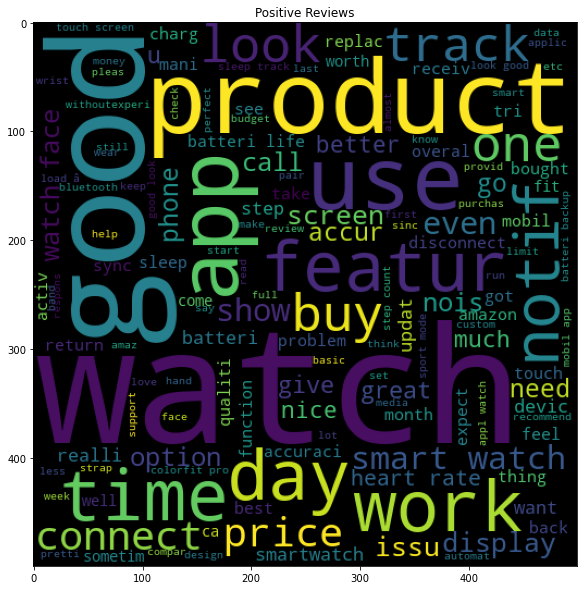

In [51]:
plt.figure(figsize=(10,10))
plt.imshow(Positive)
plt.title('Positive Reviews')
plt.show()

# Generate Negative Reviews Word Cloud

In [52]:
Negative=wc.generate(data[data['Polarity']<0]['clean_review'].str.cat(sep=""))

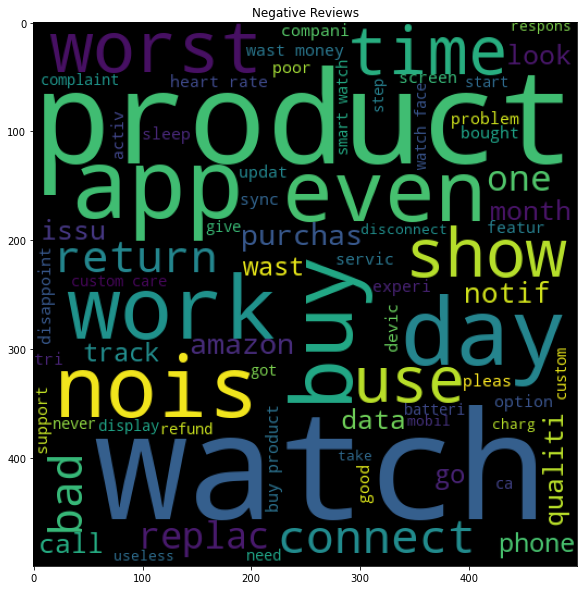

In [53]:
plt.figure(figsize=(10,10))
plt.imshow(Negative)
plt.title('Negative Reviews')
plt.show()

# Generate Neutral Reviews Word Cloud

In [54]:
Neutral=wc.generate(data[data['Polarity']==0]['clean_review'].str.cat(sep=""))

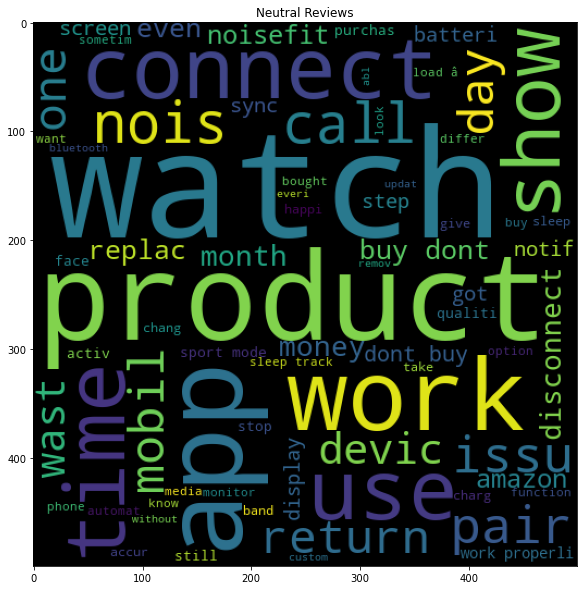

In [55]:
plt.figure(figsize=(10,10))
plt.imshow(Neutral)
plt.title('Neutral Reviews')
plt.show()

In [56]:
import seaborn as sns

Comparing Reviews

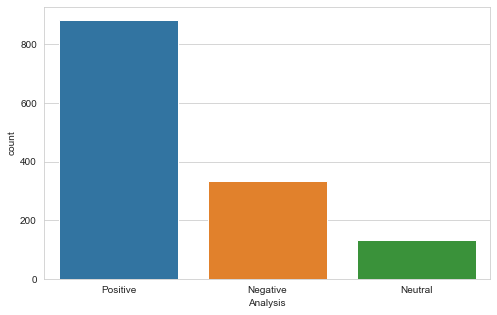

In [57]:
plt.figure(figsize=(8,5))
sns.set_style("whitegrid")
sns.countplot(x="Analysis",data=data )
plt.show()

# Positive reviews

In [58]:
j=1
sortedDF = data.sort_values(by=['Analysis'])
for i in range(0, sortedDF.shape[0]):
    if(sortedDF['Analysis'][i] == 'Positive'):
        print(str(j) + ') '+sortedDF['clean_review'][i])
        print()
        j=j+1

1) design good spec featur miband media could load â smartwatch smartband offer less similar function except one take call watch want get appl watch wife impress design fortun found nois colorfit pro 2 look similar premium like appl watch bought one box smart watch modul screen protector 22mm wide tpu charg instruct manual warranti registr card featur inch 240x240 capacit curv glass coat ip68 full dustproof 210 mah batteri 7 10 day usag 45 day bluetooth heart rate sensor sedentari alarm breath featur usual health sleep app messag social media call music menstrual cycl 9 sport mode walk yoga spin run climb workout bike hike usag 35g weight 22mm tpu band make band comfort wear also strap skin friendli get allergi sweat strap easi swap replac requir use spring pin charg magnet ping type need remov strap anyth felt type charg easiest look premium though made polycarbon grey black color curv display side size make look like appl 5 watch face like appl watch face design watch face limit cust

# Negative reviews

In [59]:
j=1
sortedDF = data.sort_values(by=['Analysis'])
for i in range(0, sortedDF.shape[0]):
    if(sortedDF['Analysis'][i] == 'Negative'):
        print(str(j) + ') '+sortedDF['clean_review'][i])
        print()
        j=j+1

1) buy productpathet qualiti product even worth 1000 rupe highli overpr advertis heart rate work slow touch even respond buy product wast money

2) worthless product support one plu phone worthless product pleas dont buy

3) even worth 500 rupe beg buythi worst product ever purchas thank amazon refund assur get 3499 rupe back watch fit app never connect useless display thing wear smart watch guess 999 watch amazon worthi never ever buy friend person 5 6 day experi attach oneplu 7 pro vivo iphon oppo mani attach pictur phone doubt someth must wrong phone ya rate fit app never never buy serious beg want wast hard earn money

4) buy horribleveri worst product recommend buy lot glitch watch never connect sometim never vibrat call never play music etc work way fool posit review request replac

5) notificationplz buy watch smart watch smart band call massag notif show watch bad experi nois puls watch

6) made foooldont purchas total dumb watch ever seen touch work time time call notif still 

# Neutral reviews

In [60]:
j=1
sortedDF = data.sort_values(by=['Analysis'])
for i in range(0, sortedDF.shape[0]):
    if(sortedDF['Analysis'][i] == 'Neutral'):
        print(str(j) + ') '+sortedDF['clean_review'][i])
        print()
        j=j+1

1) display imag misleadingth screen size actual product display product descript mislead

2) made chinai purchas nois product thought would made india sadli also made china product nois made china

3) qualityth product adequ qualiti alert notif dont come

4) 0 wast money look onlyworst watch ever keep disconnect phone 2nd day stop connect im get call elert msg elert restart phone amd watch even applic still nit get alert msg

5) incomplet orderreceiv differ product miss accessori

6) unsatisfiednot satisfi featur qualiti compar amazefit

7) caus rash son wristth media could load â son use watch play sleep daili sinc 24 oct today dinner notic wrist rash mark watch worn surpris watch suitabl damag skin quit possibl may skin also

8) reset data oftenthi replac devic receiv unfortun face mobil app captur data lost2 watch keep get reset3 lag touch screen wake twist

9) nois colorfit puls smartwatchbest product colorfit puls look premium suitabl men goe day depend upon product gift dear watc

# Model Building

# Doing for Imbalance Dataset

In [61]:
from sklearn.feature_extraction.text import CountVectorizer,TfidfVectorizer
cv=CountVectorizer()
vectorizer=TfidfVectorizer(max_features=10000)

In [62]:
X=vectorizer.fit_transform(data['clean_review'])

In [63]:
X.shape

(1347, 4589)

# LabelEncoder & MultiLabelBinarizer

In [64]:
from sklearn.preprocessing import LabelEncoder
encoder=LabelEncoder()
from sklearn.preprocessing import MultiLabelBinarizer
mlb = MultiLabelBinarizer()
from sklearn.preprocessing import OneHotEncoder
enc = OneHotEncoder()
from sklearn import preprocessing
lb = preprocessing.LabelBinarizer()

In [65]:
data['target']=mlb.fit(data['Analysis'])

<ipython-input-65-6da7e2892f2a>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['target']=mlb.fit(data['Analysis'])


In [66]:
data['target']=mlb.transform(data['Analysis'])

<ipython-input-66-088540dc49f3>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['target']=mlb.transform(data['Analysis'])


In [67]:
data['target'].value_counts()

0    883
1    464
Name: target, dtype: int64

In [68]:
data

,rating,reviews,clean_review,num_words,Subjectivity,Polarity,Analysis,target
0,5,"4.5 â­Awesome design, good specs and features...",design good spec featur miband media could loa...,379,0.460618,2.613863e-01,Positive,0
1,1,DO NOT BUY THIS PRODUCTPathetic quality produc...,buy productpathet qualiti product even worth 1...,22,0.250000,-2.775558e-17,Negative,1
2,2,Issue in smartwatchI am not getting call notif...,issu smartwatchi get call notif smart watch,7,0.642857,2.142857e-01,Positive,0
3,1,Looks doesn't matter.. Completely Worthless!!A...,look matter complet worthless apart show accur...,57,0.425108,1.194805e-01,Positive,0
4,1,worthless product.this product does not suppor...,worthless product support one plu phone worthl...,11,0.900000,-8.000000e-01,Negative,1
5,4,"Oh yes,love itðThe media could not be loade...",oh ye love media could load â receiv watch pre...,22,0.600000,6.000000e-01,Positive,0
6,1,Don't buy this product!!Don't buy this product...,buy product buy product receiv product 23rd de...,37,0.642857,2.142857e-01,Positive,0
7,1,Bluetooth coverage is low..max 1 to 2 mtrsBlue...,bluetooth coverag low max 1 2 mtrsbluetooth co...,58,0.472738,6.702381e-02,Positive,0
8,4,Read it! before buyingThe product is good for ...,read buyingth product good price sold accuraci...,53,0.458333,3.916667e-01,Positive,0
9,4,"Value for moneyAfter using for 20 days, i am h...",valu moneyaft use 20 day write review product ...,106,0.424872,4.315385e-01,Positive,0


In [69]:
y=data['target'].values
y

array([0, 1, 0, ..., 0, 0, 1])

Import train test split

In [70]:
from sklearn.model_selection import train_test_split   

In [71]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.1,random_state=40)

# Doing for Balancing by using SMOTE [Synthetic Minority Oversampling Technique]

In [72]:
from collections import Counter
from imblearn.over_sampling import RandomOverSampler
from imblearn.over_sampling import SMOTE

In [73]:
smt=SMOTE()
X_train1,y_train1=smt.fit_resample(X_train,y_train)
X_test1,y_test1=smt.fit_resample(X_test,y_test)

Import Libraries

In [74]:
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.naive_bayes import MultinomialNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score,confusion_matrix,precision_score,recall_score,f1_score

In [75]:
svc=SVC(kernel='sigmoid',gamma=2.0)
knc=KNeighborsClassifier()
mnb=MultinomialNB()
dtc=DecisionTreeClassifier(max_depth=5)
lrc=LogisticRegression(solver='liblinear',penalty='l1')
rfc=RandomForestClassifier(n_estimators=50,random_state=2)
xgb=XGBClassifier()

In [76]:
clfs={
    'SVC':svc,
    'KN':knc,
    'NB':mnb,
    'DT':dtc,
    'LR':lrc,
    'RF':rfc,
    'XGB':xgb
}

In [77]:
def train_classifier(clf,X_train1,y_train1,X_test1,y_test1):
    clf.fit(X_train1,y_train1)
    y_pred=clf.predict(X_test1)
    accuracy=accuracy_score(y_test1,y_pred)
    precision=precision_score(y_test1,y_pred)
    recall=recall_score(y_test1,y_pred)
    f1=f1_score(y_test1,y_pred)
    
    return accuracy,precision,recall,f1

In [78]:
accuracy_scores=[]
precision_scores=[]
recall_scores=[]
f1_scores=[]

for name,clf in clfs.items():
    
    current_accuracy,current_precision,current_recall,current_f1=train_classifier(clf,X_train1,y_train1,X_test1,y_test1)
    
    print("For -",name)
    print("Accuracy -",current_accuracy)
    print("precision -",current_precision)
    print("recall -",current_recall)
    print("f1 -",current_f1)
    
    accuracy_scores.append(current_accuracy)
    precision_scores.append(current_precision)
    recall_scores.append(current_recall)
    f1_scores.append(current_f1)

For - SVC
Accuracy - 0.8837209302325582
precision - 0.875
recall - 0.8953488372093024
f1 - 0.8850574712643678
For - KN
Accuracy - 0.5
precision - 0.5
recall - 1.0
f1 - 0.6666666666666666
For - NB
Accuracy - 0.8255813953488372
precision - 0.8333333333333334
recall - 0.813953488372093
f1 - 0.8235294117647058
For - DT
Accuracy - 0.7441860465116279
precision - 0.6981132075471698
recall - 0.8604651162790697
f1 - 0.7708333333333334
For - LR
Accuracy - 0.9127906976744186
precision - 0.8817204301075269
recall - 0.9534883720930233
f1 - 0.9162011173184358
For - RF
Accuracy - 0.8546511627906976
precision - 0.8860759493670886
recall - 0.813953488372093
f1 - 0.8484848484848485
[10:57:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\lenovo\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


For - XGB
Accuracy - 0.8662790697674418
precision - 0.8539325842696629
recall - 0.8837209302325582
f1 - 0.8685714285714285


In [79]:
performance_data=pd.DataFrame({'Algorithm':clfs.keys(),'Accuracy':accuracy_scores,'precision':precision_scores,'recall':recall_scores,'f1':f1_scores}).sort_values('Accuracy',ascending='False')
performance_data

,Algorithm,Accuracy,precision,recall,f1
1,KN,0.500000,0.500000,1.000000,0.666667
3,DT,0.744186,0.698113,0.860465,0.770833
2,NB,0.825581,0.833333,0.813953,0.823529
5,RF,0.854651,0.886076,0.813953,0.848485
6,XGB,0.866279,0.853933,0.883721,0.868571
0,SVC,0.883721,0.875000,0.895349,0.885057
4,LR,0.912791,0.881720,0.953488,0.916201


In [80]:
performance_data=pd.melt(performance_data,id_vars='Algorithm')

In [81]:
performance_data

,Algorithm,variable,value
0,KN,Accuracy,0.500000
1,DT,Accuracy,0.744186
2,NB,Accuracy,0.825581
3,RF,Accuracy,0.854651
4,XGB,Accuracy,0.866279
5,SVC,Accuracy,0.883721
6,LR,Accuracy,0.912791
7,KN,precision,0.500000
8,DT,precision,0.698113
9,NB,precision,0.833333


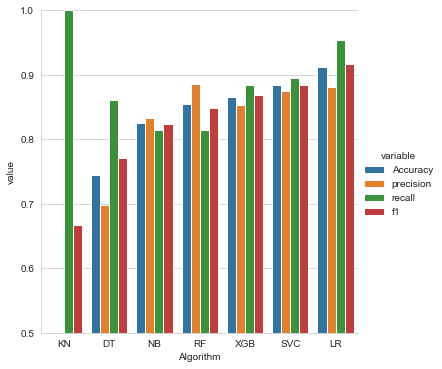

In [82]:
sns.catplot(x='Algorithm',y='value',
           hue='variable',data=performance_data,kind='bar',height=5)
plt.ylim(0.5,1.0)
plt.xticks(rotation='horizontal')
plt.show()

# logistic Regression giving the best result ,we can use it for deployment

In [83]:
lrc=LogisticRegression(solver='liblinear',penalty='l1')
lrc.fit(X_train1,y_train1)
y_pred=lrc.predict(X_test1)
print(accuracy_score(y_test1,y_pred))
print(recall_score(y_test1,y_pred))
print(precision_score(y_test1,y_pred))
print(f1_score(y_test1,y_pred))

0.9127906976744186
0.9534883720930233
0.8817204301075269
0.9162011173184358
